# In this notebook: 
    - Run PLSR, RF, and NN models on set
    - We explored the power of vegetative bands to model N content, now let's try more bands using ML

In [1]:
# Import modules
# Fundamental data manipulationa nd visualization packages
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px

# machine learning and data preprocessing tools from sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score

# Pytorch utils for neural net
import torch
import torch.nn as nn
from torch.utils.data import Dataset
import torch.nn.functional as F

In [5]:
# df should point to ScansNutesAll
df = pd.read_csv(r'SomeFolders/../ScansNutesALL.csv')
df = df[(df['Year'] == 2020) | (df['Year'] == 2022) & (df['Field'] == 'BLove')]
df_train = df[df['DateSampled'] != '8/4/2020']
df_test = df[df['DateSampled'] == '8/4/2020']
# fraction of test split
print(len(df_test)/len(df))
# set seed for torch and other ML functions
np.random.seed(42)

0.2760942760942761


In [53]:
# Look at columns we want 
print(df_test.columns[40:375])
print(df_train.columns[40:375])
x_train = df_train.iloc[:,40:375].values
y_train = df_train['N'].values
x_test = df_test.iloc[:, 40:375].values
y_test = df_test['N'].values


Index(['469', '471', '472', '473', '475', '476', '477', '479', '480', '481',
       ...
       '902', '904', '905', '906', '908', '909', '910', '912', '913', '914'],
      dtype='object', length=335)
Index(['469', '471', '472', '473', '475', '476', '477', '479', '480', '481',
       ...
       '902', '904', '905', '906', '908', '909', '910', '912', '913', '914'],
      dtype='object', length=335)


In [54]:
from sys import stdout

def pls_variable_selection(X, y, max_comp):
    # Create an empty array to store mse values
    mse = np.zeros((max_comp,X.shape[1]))
    # Outer loop optimizes num of components
    for i in range(max_comp):
        pls1 = PLSRegression(n_components=i+1)
        pls1.fit(X, y)
        sorted_ind = np.argsort(np.abs(pls1.coef_[:,0]))
        Xc = X[:,sorted_ind]
        # Inner loop optimizes input features
        for j in range(Xc.shape[1]-(i+1)):
            pls2 = PLSRegression(n_components=i+1)
            pls2.fit(Xc[:, j:], y)
            y_cv = cross_val_predict(pls2, Xc[:, j:], y, cv=3)
            mse[i,j] = mean_squared_error(y, y_cv)
        comp = 100*(i+1)/(max_comp)
        stdout.write("\r%d%% completed" % comp)
        stdout.flush()
        stdout.write("\n")
    #Calculate and print the position of minimum in MSE
    mseminx,mseminy = np.where(mse==np.min(mse[np.nonzero(mse)]))
    rpd_cv = y.std()/np.sqrt(mse[mseminx,mseminy][0])
    print("Optimised number of PLS components: ", mseminx[0]+1)
    print("Wavelengths to be discarded ",mseminy[0])
    print('Optimised MSEP ', mse[mseminx,mseminy][0])
    print('RPD CV', rpd_cv)
    stdout.write("\n")
    # Build model with optimisez params for output
    Opt_components = mseminx[0]+1
    pls = PLSRegression(n_components=Opt_components)
    pls.fit(X, y)
    sorted_ind = np.argsort(np.abs(pls.coef_[:, 0]))
    Xc = X[:, sorted_ind]
    wavD = mseminy[0]
    # Slice of sorted X matrix that only contains kept wavelengths
    Opt_x = Xc[:, wavD:]
    pls.fit(Opt_x, y)
    return (pls, Opt_components, wavD, sorted_ind)

In [55]:
# Optimise our model
pls, Opt_components, wavD, sorted_ind = pls_variable_selection(x_train, y_train, 12)
x_test_plsr = x_test[:, sorted_ind]
x_test_plsr = x_test_plsr[:, wavD:]
y_test_cv = cross_val_predict(pls, x_test_plsr, y_test, cv = 3)
mse_test = mean_squared_error(y_test, y_test_cv)
r2 = r2_score(y_test, y_test_cv)
print('External Validation MSE:', mse_test)
print('External Validation Goodness-of-Fit', r2)

8% completed
16% completed
25% completed
33% completed
41% completed
50% completed
58% completed
66% completed
75% completed
83% completed
91% completed
100% completed
Optimised number of PLS components:  4
Wavelengths to be discarded  330
Optimised MSEP  0.17708433017644168
RPD CV 1.3379909984996565

External Validation MSE: 0.1172134652162179
External Validation Goodness-of-Fit 0.5694185540984832


In [49]:
def RF_variable_selection(x, y):
    mse = np.zeros(x.shape[1])
    rf1 = RandomForestRegressor()
    rf1.fit(x, y)
    # Sort spectra according to ascending feature_importances
    sorted_ind = np.argsort(rf1.feature_importances_)
    x_sort = x[:,sorted_ind]
    # discard one wavelength at a time calculate and store mse
    for w in range(x_sort.shape[1]):
        rf1 = RandomForestRegressor(n_estimators=50)
        rf1.fit(x_sort[:, w:], y)
        predictions = rf1.predict(x_sort[:, w:])
        #predictions = cross_val_predict(rf1, x_sort[:, w:], y, cv = 3)
        mse[w] = mean_squared_error(y, predictions)
        mseminw = np.where(mse == np.min(mse))
        print('{} % done'.format(w/x_sort.shape[1]*100))
    print("Wavelengths to be discarded:", mseminw[0])
    print('Optimised MSEP:', mse[mseminw])
    # return the optimised model
    rf1 = RandomForestRegressor(n_estimators=100)
    rf1 = rf1.fit(x_train, y_train)
    sorted_ind = np.argsort(rf1.feature_importances_)
    x_sort = x[:,sorted_ind]
    print(sorted_ind.shape, x.shape)
    wavD = mseminw[0][0]
    rf1 = rf1.fit(x_sort[:, wavD:], y)
    predictions = cross_val_predict(rf1, x_sort[:, wavD:], y, cv = 3)
    print(r2_score(y, predictions))
    return rf1, mse

In [34]:
def RF_variable_selection(x, y):
    rf1 = RandomForestRegressor(n_estimators=250)
    rf1.fit(x, y)
    predictions = cross_val_predict(rf1, x, y, cv = 3)
    print(r2_score(y, predictions))
    return rf1

In [50]:
rf, mse = RF_variable_selection(x=x_train, y= y_train)

0.0 % done
0.2857142857142857 % done
0.5714285714285714 % done
0.8571428571428572 % done
1.1428571428571428 % done
1.4285714285714286 % done
1.7142857142857144 % done
2.0 % done
2.2857142857142856 % done
2.571428571428571 % done
2.857142857142857 % done
3.1428571428571432 % done
3.428571428571429 % done
3.7142857142857144 % done
4.0 % done
4.285714285714286 % done
4.571428571428571 % done
4.857142857142857 % done
5.142857142857142 % done
5.428571428571429 % done
5.714285714285714 % done
6.0 % done
6.2857142857142865 % done
6.571428571428571 % done
6.857142857142858 % done
7.142857142857142 % done
7.428571428571429 % done
7.7142857142857135 % done
8.0 % done
8.285714285714285 % done
8.571428571428571 % done
8.857142857142856 % done
9.142857142857142 % done
9.428571428571429 % done
9.714285714285714 % done
10.0 % done
10.285714285714285 % done
10.571428571428571 % done
10.857142857142858 % done
11.142857142857142 % done
11.428571428571429 % done
11.714285714285715 % done
12.0 % done
12.2

In [56]:
predictions_cv = cross_val_predict(rf, x_test, y_test, cv = 3)
r2 = r2_score(y_test, predictions_cv)
mse = mean_squared_error(y_test, predictions_cv)
print(mse, r2)

0.1653918839024392 0.3924360449567643


In [57]:
x_train_tensor = torch.FloatTensor(x_train)
x_test_tensor = torch.FloatTensor(x_test)
# we can just go straight to tensors for y unsqueeze so dimensions match
y_train_tensor = torch.tensor(df_train['N'].values).unsqueeze(1)
y_test_tensor = torch.tensor(df_test['N'].values).unsqueeze(1)

In [58]:
# We will make the number of neurons in hidden layers = ((input features + output) / 2) 
class Net(torch.nn.Module):
    def __init__(self, n_feature, n_output):
        super(Net, self).__init__()
        self.fc1 = torch.nn.Linear(n_feature, 179)
        self.fc2 = torch.nn.Linear(179, 90)
        self.fc3 = torch.nn.Linear(90, 45)
        self.predict = torch.nn.Linear(45, n_output)

    def forward(self, x):
        out = self.fc1(x)
        out = F.relu(out)
        out = self.fc2(out)
        out = F.relu(out)
        out = self.fc3(out)
        out = F.relu(out)
        x = self.predict(out)             # linear output
        return x

In [95]:
net = Net(335, 1)
criterion = torch.nn.MSELoss()
optimizer = torch.optim.SGD(net.parameters(), lr = 0.0001)

In [96]:
e = 250000
larray = np.zeros(len(range(e)))
for epoch in range(e):
    x = x_train_tensor.float()
    y = y_train_tensor.float()
    outputs = net(x)
    loss = criterion(y, outputs)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    r2 = r2_score(y.detach().numpy(), outputs.detach().numpy())
    print('Epoch {}/{}, Loss: {:.4f}, R2: {}'.format(epoch+1, e, loss, r2))
    with torch.no_grad():
        predictions = net(x_test_tensor)
        r2 = r2_score(y_test_tensor.detach().numpy(), predictions.detach().numpy())
        larray[epoch] = r2

Epoch 1/250000, Loss: 11.6691, R2: -35.80888381936482
Epoch 2/250000, Loss: 11.6571, R2: -35.771032251547226
Epoch 3/250000, Loss: 11.6452, R2: -35.73325206664409
Epoch 4/250000, Loss: 11.6332, R2: -35.695568320558614
Epoch 5/250000, Loss: 11.6213, R2: -35.65805879048014
Epoch 6/250000, Loss: 11.6095, R2: -35.62068239983864
Epoch 7/250000, Loss: 11.5977, R2: -35.583468045299796
Epoch 8/250000, Loss: 11.5859, R2: -35.54644652991867
Epoch 9/250000, Loss: 11.5743, R2: -35.50963165315611
Epoch 10/250000, Loss: 11.5627, R2: -35.47300916431415
Epoch 11/250000, Loss: 11.5511, R2: -35.4365485401747
Epoch 12/250000, Loss: 11.5396, R2: -35.40020124301436
Epoch 13/250000, Loss: 11.5281, R2: -35.36395215114258
Epoch 14/250000, Loss: 11.5166, R2: -35.32780157937596
Epoch 15/250000, Loss: 11.5052, R2: -35.29174775774562
Epoch 16/250000, Loss: 11.4938, R2: -35.25580061696624
Epoch 17/250000, Loss: 11.4824, R2: -35.219929584848245
Epoch 18/250000, Loss: 11.4711, R2: -35.184179057527786
Epoch 19/250000

In [97]:
# Now we predict our training set and we can compare this value directly to one from PLSR3
with torch.no_grad():
    predictions = net(x_test_tensor)
    r2 = r2_score(y_test_tensor.detach().numpy(), predictions.detach().numpy())
    mse = mean_squared_error(y_test_tensor.detach().numpy(), predictions.detach().numpy(), multioutput='uniform_average')
print(r2, mse)

0.541855837525749 0.12471662530593897


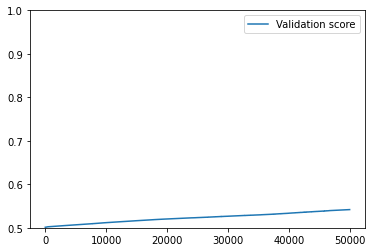

In [103]:
plt.plot(larray[-50000:], label = 'Validation score')
plt.ylim([0.5,1])
plt.legend()
plt.show()

# Discussion:
 - 2 of 3 ML approaches preformed better than ndvi based but come at increased computer cost
    - computational resources not infinite even though a lot of biologist act like they are (myself)
 - In previous year, before 2022, achieved slightly higher scores but this might be due to more variation in training set now
 